# Extract frames from videos

In [2]:
import cv2
import os
import glob
from tqdm import tqdm

In [3]:
PATH_violence = "Data/Real Life Violence Dataset/Violence"

In [ ]:
os.makedirs('./data/Violence',exist_ok=True)
for path in tqdm(glob.glob(PATH_violence+'/*')):
    fname = os.path.basename(path).split('.')[0]
    vidcap = cv2.VideoCapture(path)
    success,image = vidcap.read()
    count = 0
    while success:
        if count % 5 == 0:
            cv2.imwrite("./data/Violence/{}-{}.jpg".format(fname,str(count).zfill(4)),image)     # save frame as JPEG file      
        success,image = vidcap.read()
        count += 1

In [5]:
PATH_nonviolence = "Data/Real Life Violence Dataset/NonViolence"

In [23]:
os.makedirs('./data/NonViolence',exist_ok=True)
for path in tqdm(glob.glob(PATH_nonviolence+'/*')):
    fname = os.path.basename(path).split('.')[0]
    vidcap = cv2.VideoCapture(path)
    success,image = vidcap.read()
    count = 0
    while success:
        if count % 5 == 0:
            cv2.imwrite("./data/NonViolence/{}-{}.jpg".format(fname,str(count).zfill(4)),image)     # save frame as JPEG file      
        success,image = vidcap.read()
        count += 1

100%|██████████| 1000/1000 [02:23<00:00,  6.98it/s]


# Data preperation

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory
import torch.nn.functional as F
import pathlib


cudnn.benchmark = True
plt.ion()   # interactive mode

In [2]:
# Hyper-parameters 
num_epochs = 25
batch_size = 4
learning_rate = 0.001

In [3]:
# Data augmentation and normalization for training
# Just normalization for validation
train_transform = transforms.Compose([
        transforms.Resize(226),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomGrayscale(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
   
val_transform =transforms.Compose([
        transforms.Resize(226),
        transforms.CenterCrop(224),
        transforms.RandomGrayscale(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])



In [4]:

train_path = 'data/fight'

trainset = torchvision.datasets.ImageFolder(train_path, transform=train_transform)

train_size = int(0.8 * len(trainset))
test_size = len(trainset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(trainset, [train_size, test_size])

trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=2)

In [5]:
print(trainloader)

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [92]:
root=pathlib.Path(train_path)
classNames=sorted([j.name.split('/')[-1] for j in root.iterdir()])
print(classNames)

['NonViolence', 'Violence']


In [11]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
dataiter = iter(trainloader)
images, labels = next(dataiter)

# Make a grid from batch
out = torchvision.utils.make_grid(images)


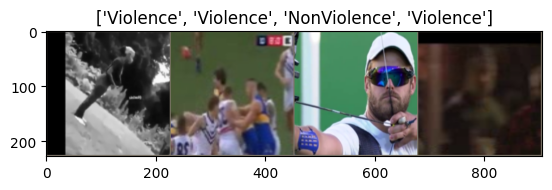

In [12]:

imshow(out, title=[classNames[x] for x in labels])

# Train the model

In [13]:
conv1 = nn.Conv2d(3, 6, 5)
pool = nn.MaxPool2d(2, 2)
conv2 = nn.Conv2d(6, 16, 5)
x = conv1(images)
print(x.shape)
x = pool(x)
print(x.shape)
x = conv2(x)
print(x.shape)
x = pool(x)
print(x.shape)

torch.Size([4, 6, 220, 220])
torch.Size([4, 6, 110, 110])
torch.Size([4, 16, 106, 106])
torch.Size([4, 16, 53, 53])


In [14]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 53 * 53, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, len(classNames))

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
net = Net().to(device)

In [15]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=learning_rate, momentum=0.9)


# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

In [16]:
train_losses, val_losses = [], []
for epoch in range(num_epochs):  # loop over the dataset multiple times
    net.train()
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data[0].to(device), data[1].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * labels.size(0)
    train_loss = running_loss / len(trainloader.dataset)
    train_losses.append(train_loss)

    #Validation phase
    net.eval()
    running_loss = 0.0
    with torch.no_grad():
        for i, data in enumerate(testloader, 0):
            # Move inputs and labels to the device
            inputs, labels = data[0].to(device), data[1].to(device)
         
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * labels.size(0)
    val_loss = running_loss / len(testloader.dataset)
    val_losses.append(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs} - Train loss: {train_loss}, Validation loss: {val_loss}")


print('Finished Training')

Epoch 1/25 - Train loss: 0.6207880902744443, Validation loss: 0.5512217882206443
Epoch 2/25 - Train loss: 0.5390133315050817, Validation loss: 0.5058048622792831
Epoch 3/25 - Train loss: 0.4907937626975427, Validation loss: 0.46248713375819556
Epoch 4/25 - Train loss: 0.4602460767645724, Validation loss: 0.43998470133927176
Epoch 5/25 - Train loss: 0.4334877681608191, Validation loss: 0.4043544425198426
Epoch 6/25 - Train loss: 0.41655905917433084, Validation loss: 0.431524707588921
Epoch 7/25 - Train loss: 0.410209247699713, Validation loss: 0.4014803748168867
Epoch 8/25 - Train loss: 0.3941822725248345, Validation loss: 0.3688038676567298
Epoch 9/25 - Train loss: 0.3850115718695327, Validation loss: 0.37195018238625016
Epoch 10/25 - Train loss: 0.37607760211572105, Validation loss: 0.36529598588628487
Epoch 11/25 - Train loss: 0.3704152169175112, Validation loss: 0.36025317251057176
Epoch 12/25 - Train loss: 0.3605174429349132, Validation loss: 0.35473064621523825
Epoch 13/25 - Train

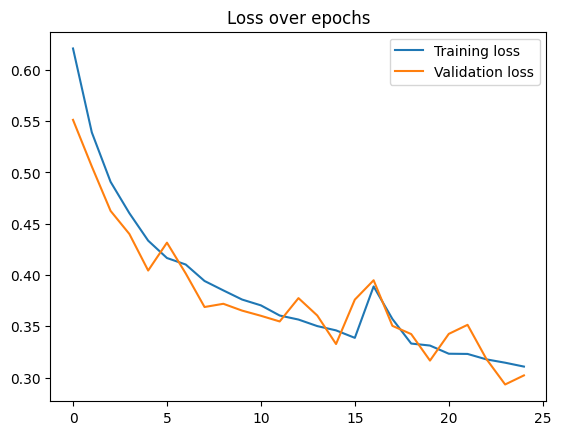

[0.6207880902744443, 0.5390133315050817, 0.4907937626975427, 0.4602460767645724, 0.4334877681608191, 0.41655905917433084, 0.410209247699713, 0.3941822725248345, 0.3850115718695327, 0.37607760211572105, 0.3704152169175112, 0.3605174429349132, 0.35658135318689066, 0.35021478441339066, 0.3460299380543914, 0.33874266701129213, 0.3888543822649902, 0.35715106775465516, 0.3331909025469144, 0.3312438608401682, 0.32327911888086275, 0.3230704477736461, 0.3177817004413138, 0.31452459519914866, 0.3107412121960935]
[0.5512217882206443, 0.5058048622792831, 0.46248713375819556, 0.43998470133927176, 0.4043544425198426, 0.431524707588921, 0.4014803748168867, 0.3688038676567298, 0.37195018238625016, 0.36529598588628487, 0.36025317251057176, 0.35473064621523825, 0.3774690804456405, 0.3605388887598185, 0.3327232037490226, 0.37601277820358875, 0.39488286423528907, 0.350439841569111, 0.34241286278539057, 0.3165973963988658, 0.34260566411830695, 0.35143755552927863, 0.31819843053466856, 0.2933042223556285, 0

In [17]:
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()
print(train_losses)
print(val_losses)

In [18]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = net(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 86 %


In [19]:
def train_model(model, scheduler):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in trainloader:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / len(trainset)
                epoch_acc = running_corrects.double() / len(trainset)

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
                    
                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

In [20]:
model_fit = train_model(net,  exp_lr_scheduler)

Epoch 0/24
----------
train Loss: 0.2464 Acc: 0.6935
val Loss: 0.2377 Acc: 0.6990

Epoch 1/24
----------
train Loss: 0.2457 Acc: 0.6949
val Loss: 0.2323 Acc: 0.7011

Epoch 2/24
----------
train Loss: 0.2453 Acc: 0.6944
val Loss: 0.2498 Acc: 0.6845

Epoch 3/24
----------
train Loss: 0.2446 Acc: 0.6944
val Loss: 0.2661 Acc: 0.6823

Epoch 4/24
----------
train Loss: 0.2386 Acc: 0.6983
val Loss: 0.2516 Acc: 0.6930

Epoch 5/24
----------
train Loss: 0.2429 Acc: 0.6958
val Loss: 0.2586 Acc: 0.6922

Epoch 6/24
----------
train Loss: 0.2380 Acc: 0.6975
val Loss: 0.2235 Acc: 0.7035

Epoch 7/24
----------
train Loss: 0.2035 Acc: 0.7130
val Loss: 0.1975 Acc: 0.7154

Epoch 8/24
----------
train Loss: 0.1958 Acc: 0.7173
val Loss: 0.1947 Acc: 0.7165

Epoch 9/24
----------
train Loss: 0.1949 Acc: 0.7170
val Loss: 0.1926 Acc: 0.7191

Epoch 10/24
----------
train Loss: 0.1946 Acc: 0.7165
val Loss: 0.1928 Acc: 0.7179

Epoch 11/24
----------
train Loss: 0.1909 Acc: 0.7190
val Loss: 0.1883 Acc: 0.7212

Ep

In [23]:
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model_fit(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 89 %


In [24]:
torch.save(model_fit.state_dict(), 'violence_model.pt')

# Display results

In [25]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(testloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {classNames[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

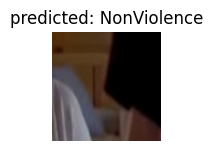

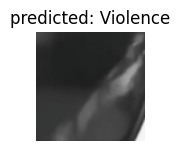

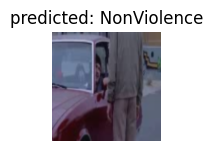

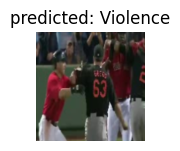

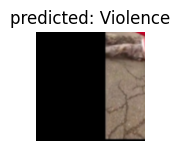

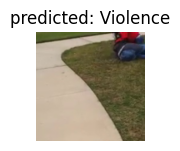

In [26]:
visualize_model(model_fit)

In [27]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classNames}
total_pred = {classname: 0 for classname in classNames}

# again no gradients needed
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model_fit(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classNames[label]] += 1
            total_pred[classNames[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: NonViolence is 87.8 %
Accuracy for class: Violence is 91.9 %


In [28]:
def visualize_model_predictions(model,img_path):
    was_training = model.training
    model.eval()

    img = Image.open(img_path)
    img = val_transform(img)
    img = img.unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        _, preds = torch.max(outputs, 1)

        ax = plt.subplot(2,2,1)
        ax.axis('off')
        ax.set_title(f'Predicted: {classNames[preds[0]]}')
        imshow(img.cpu().data[0])

        model.train(mode=was_training)

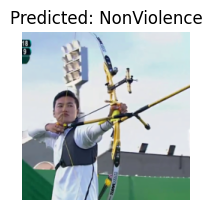

In [29]:
visualize_model_predictions(
    model_fit,
    img_path='data/fight/NonViolence/NV_6-0065.jpg'
)

plt.ioff()
plt.show()

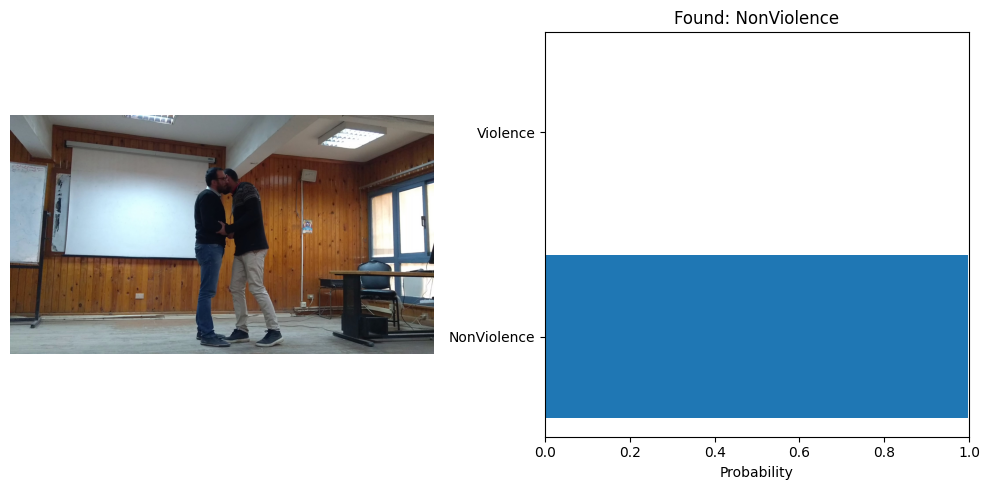

In [31]:
# Load and preprocess the image
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return image, val_transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(10, 5))
    
    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")
    
    found_classes = []
    for i, x in enumerate(classNames):
        if(probabilities[i] > 0.95):
            found_classes.append(x)
        elif(probabilities[i] > 0.5):
            found_classes.append('maybe ' + x )
    if(found_classes == []):
        found_classes.append('none')

    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Found: " + ', '.join(found_classes))
    axarr[1].set_xlim(0, 1)

 

    plt.tight_layout()
    plt.show()

test_image = "data/ValViolence/NonViolence/NonFight1/NV_1-0000.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

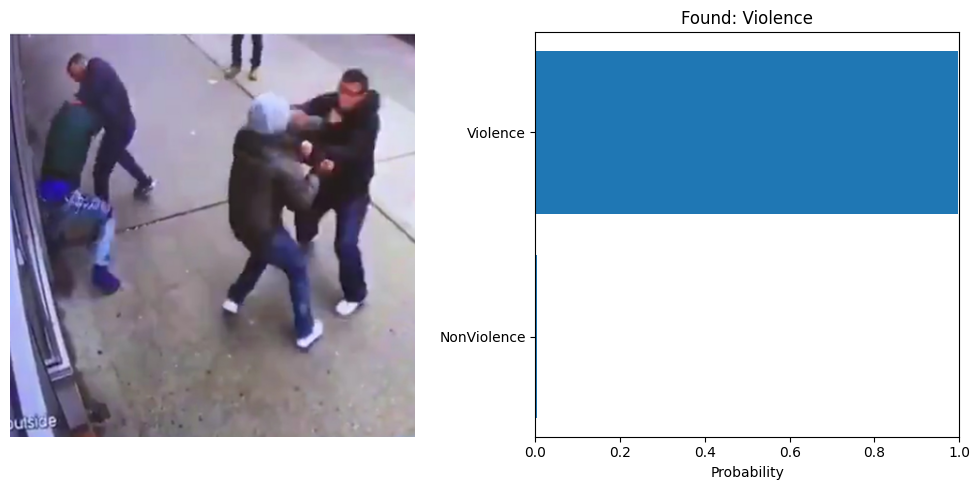

In [32]:
test_image = "data/ValViolence/Other/street_fight.0.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

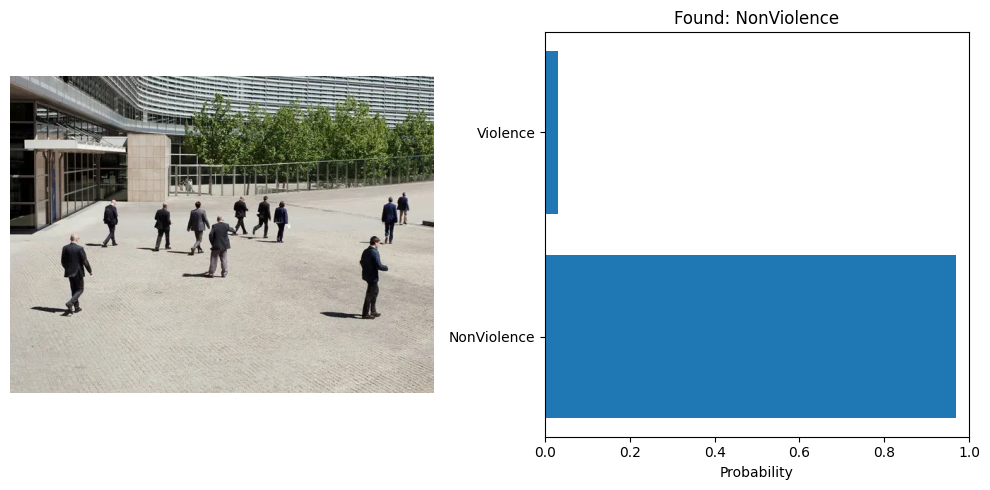

In [33]:
test_image = "data/ValViolence/Other/13cameras10-articleLarge.webp"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

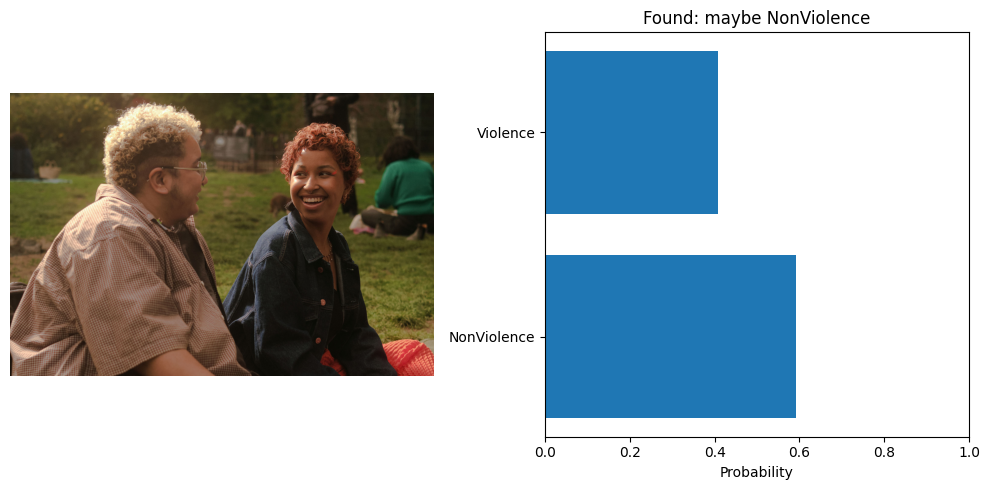

In [34]:
test_image = "data/ValViolence/Other/Science-of-Attraction-feat.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

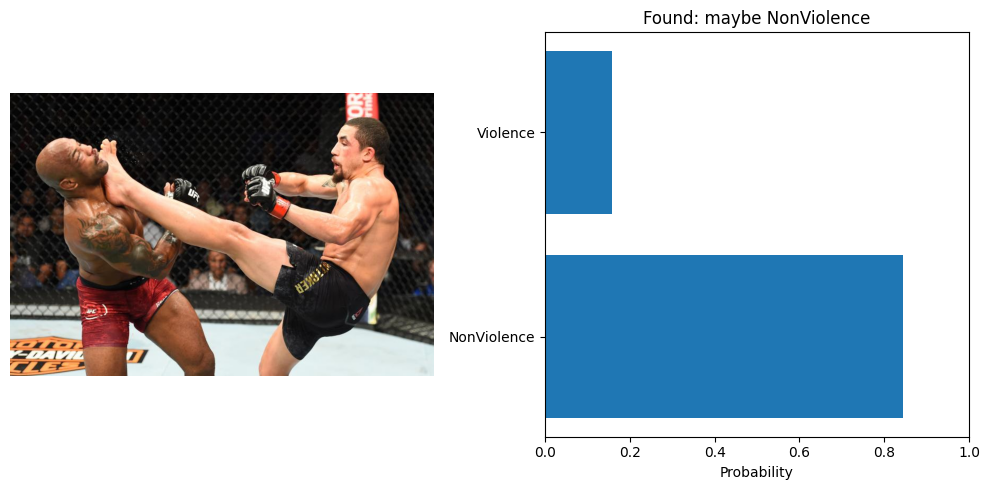

In [40]:
test_image = "data/ValViolence/Other/GettyImages-970681494.jpg"


original_image, image_tensor = preprocess_image(test_image)
probabilities = predict(model_fit, image_tensor, device)


visualize_predictions(original_image, probabilities, classNames)

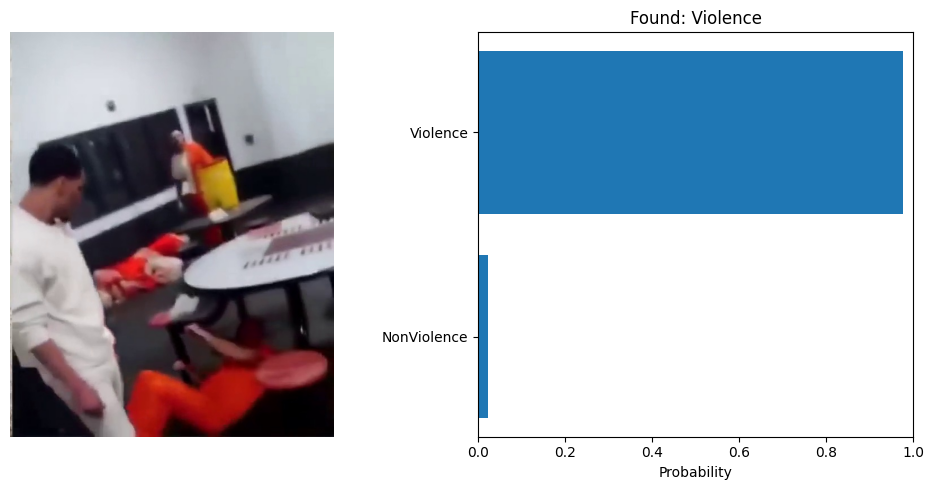

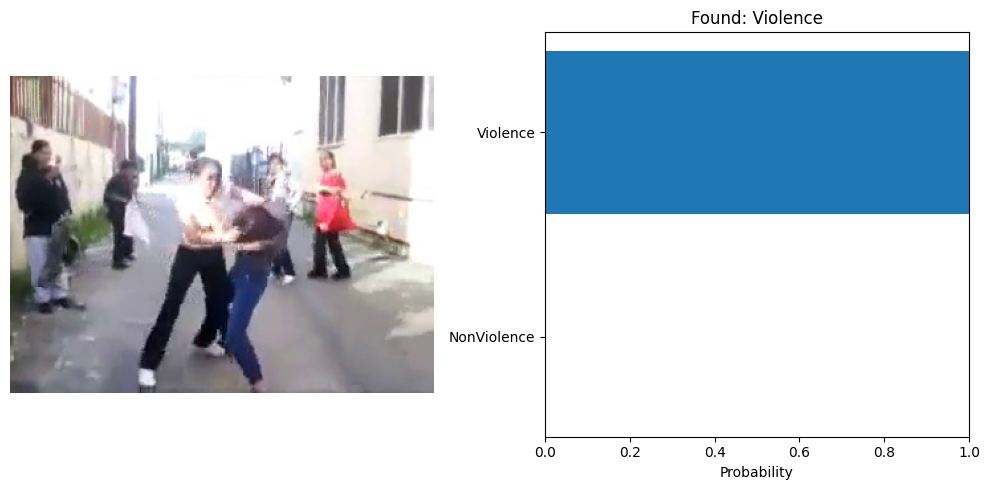

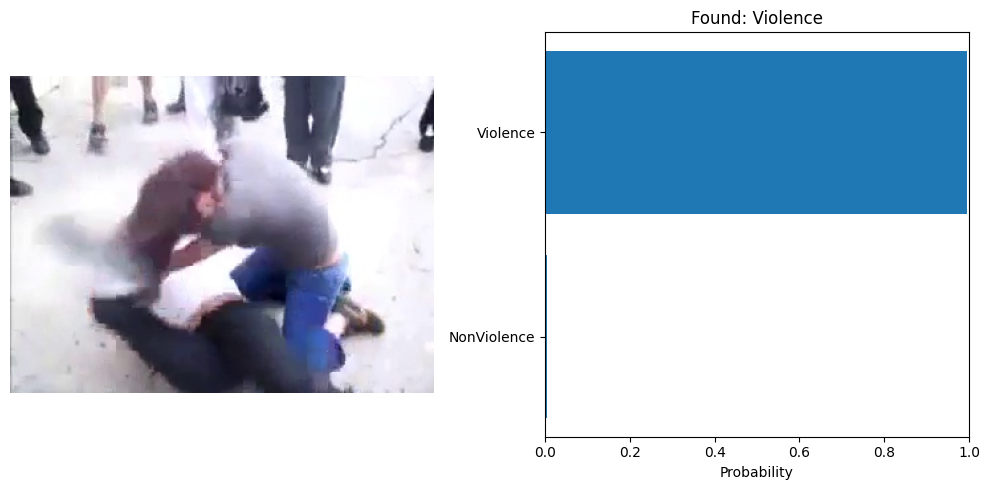

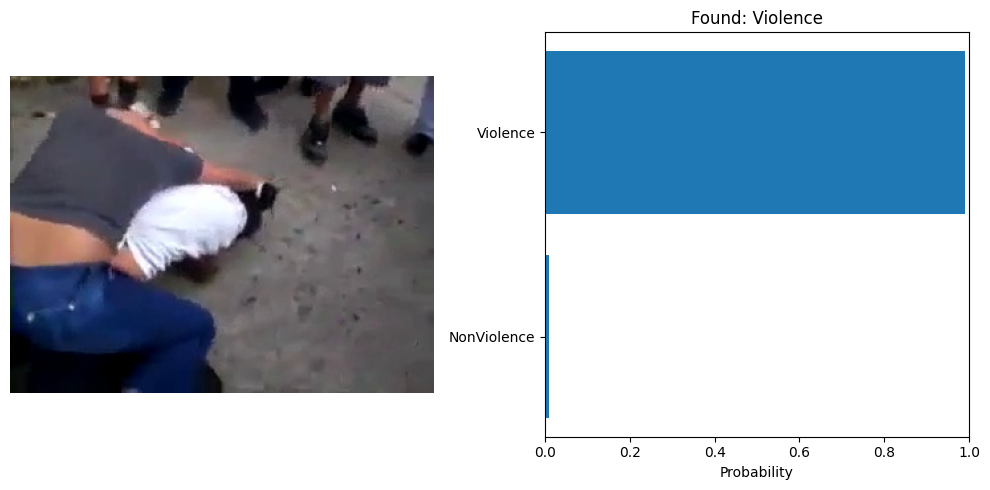

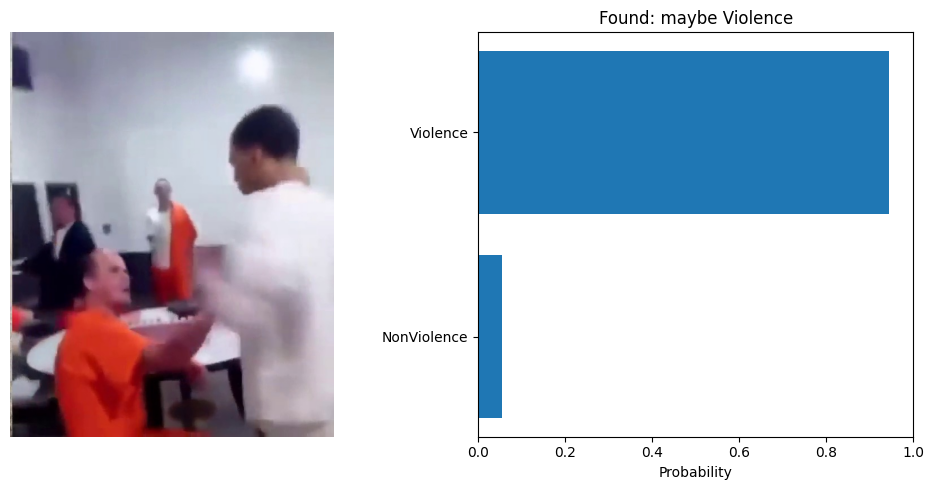

...

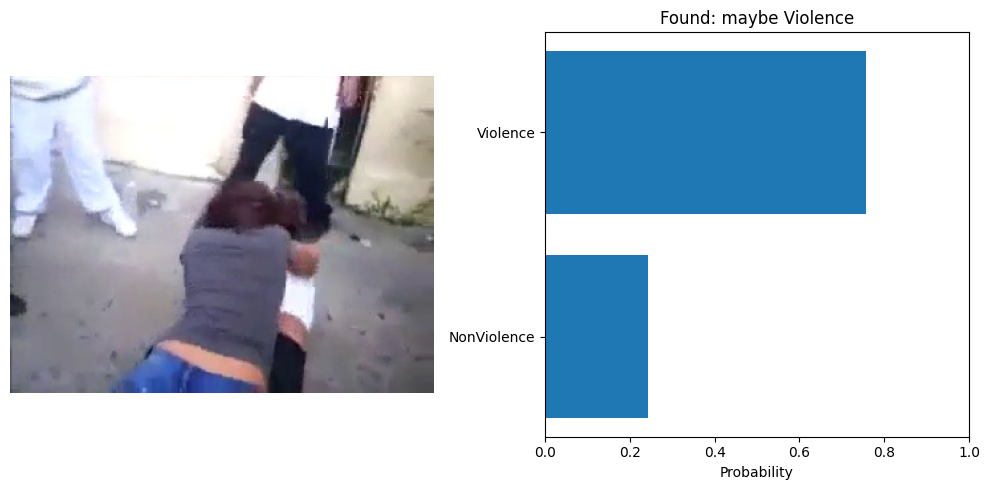

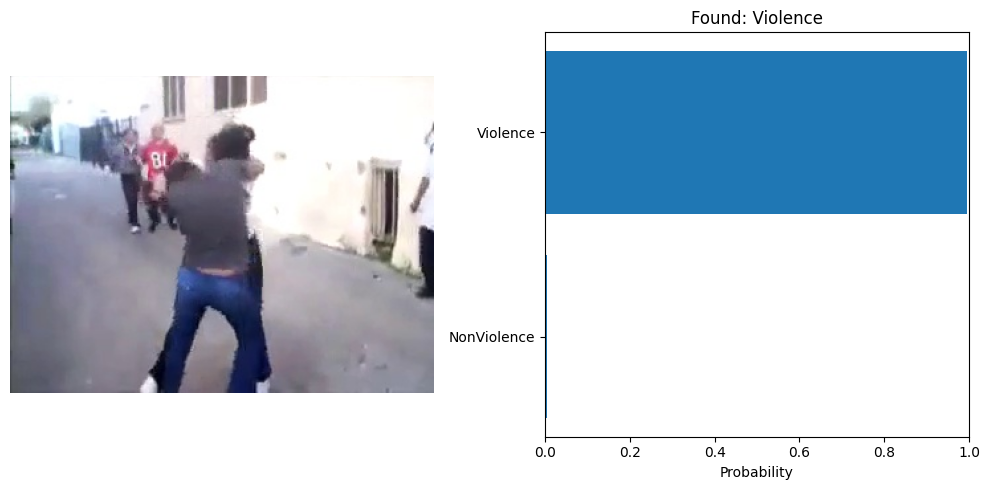

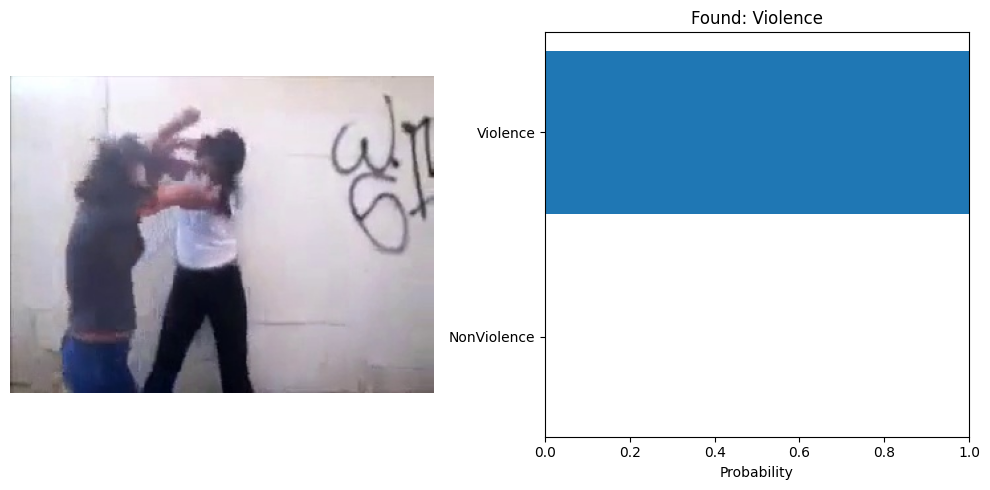

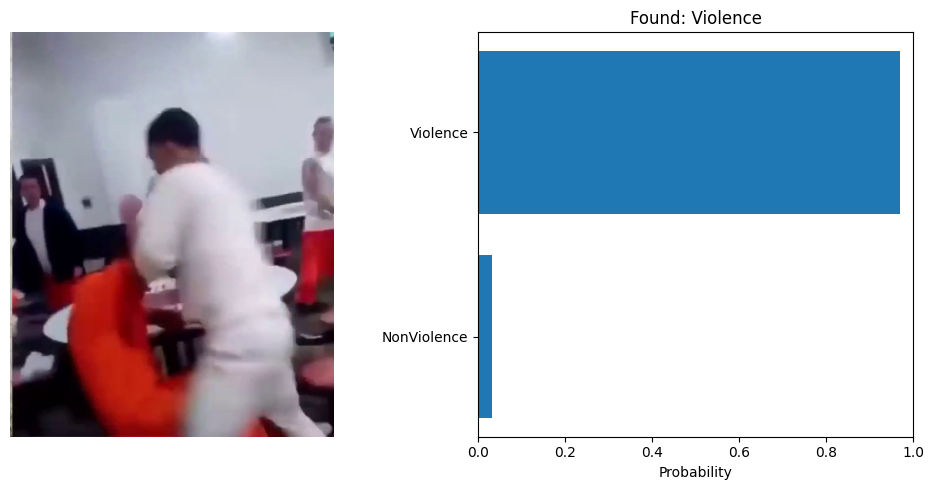

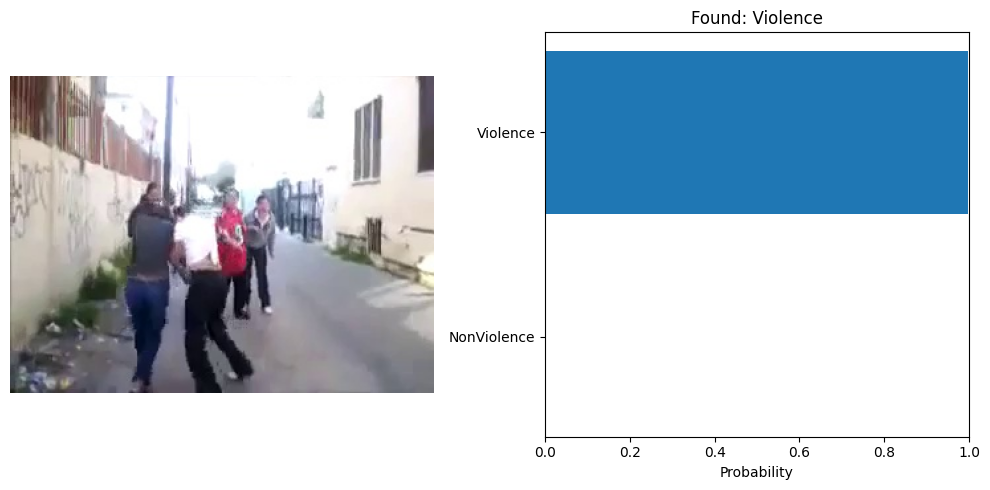

In [42]:
from glob import glob
test_images = glob('data/ValViolence/Violence/*/**')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)

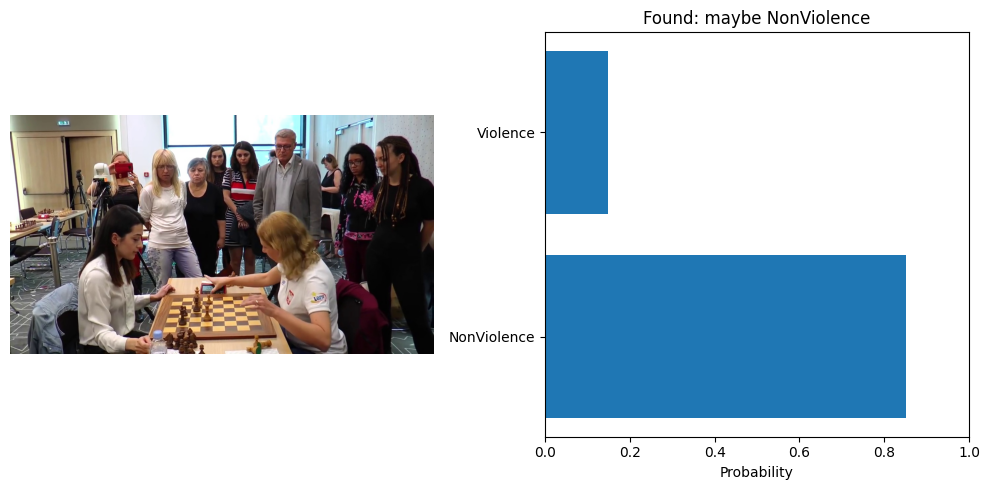

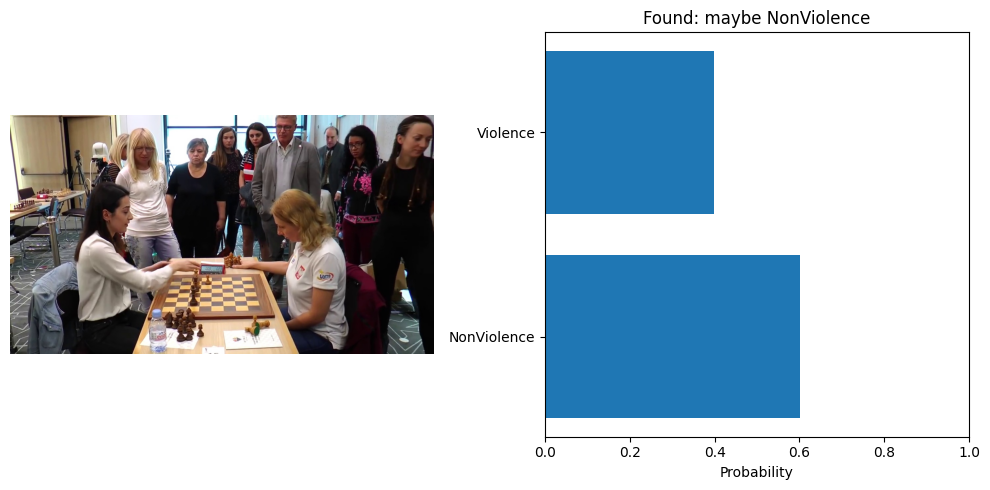

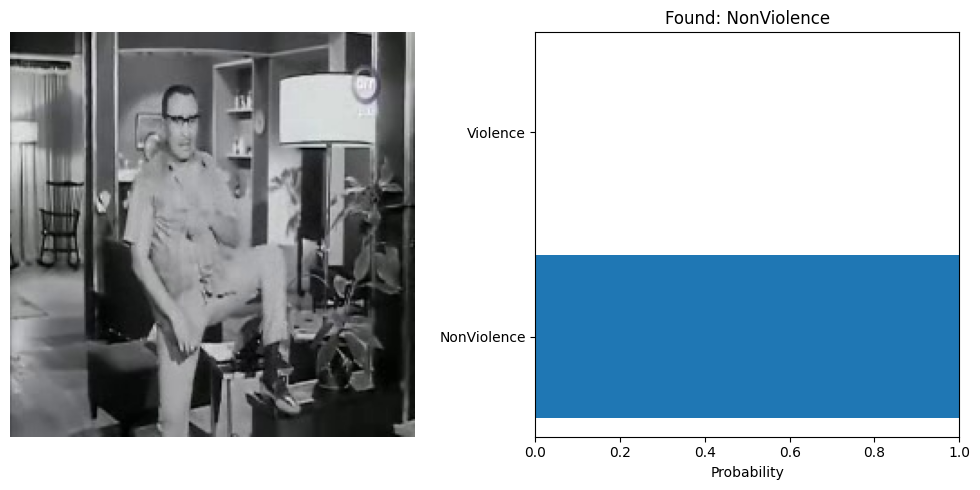

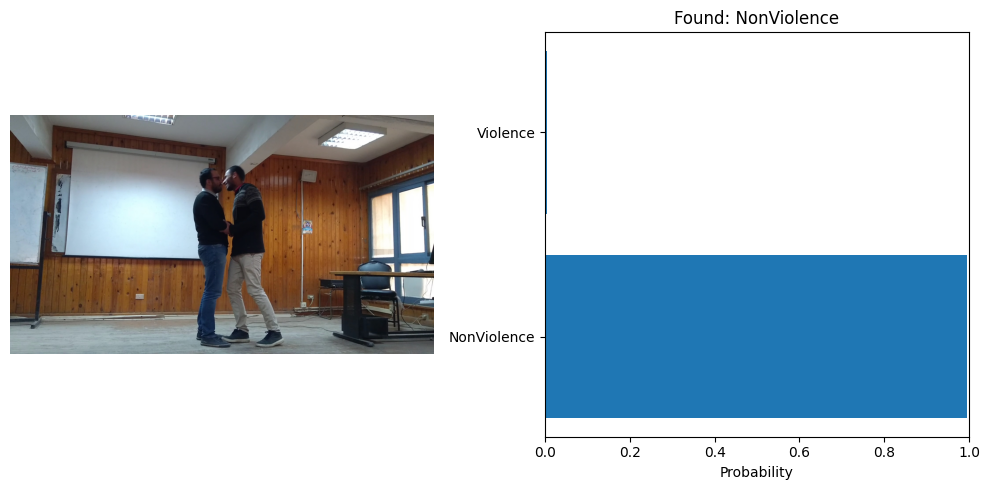

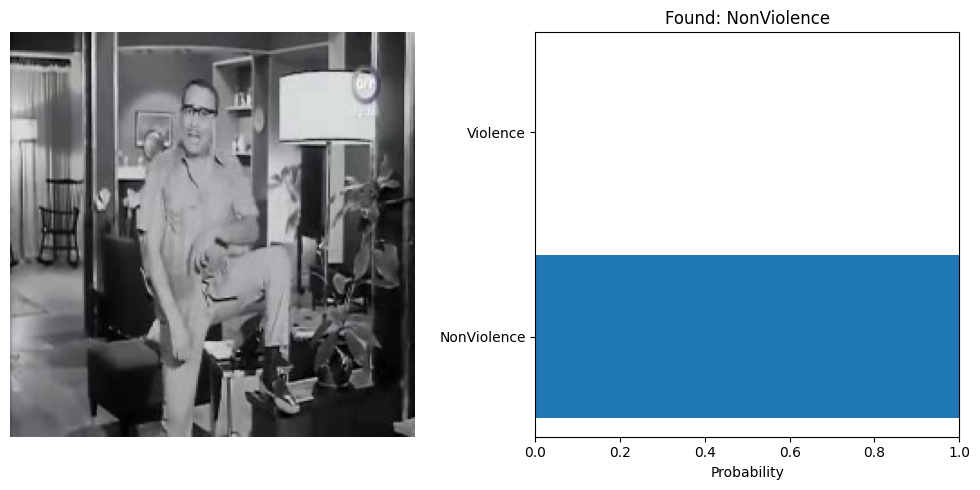

...

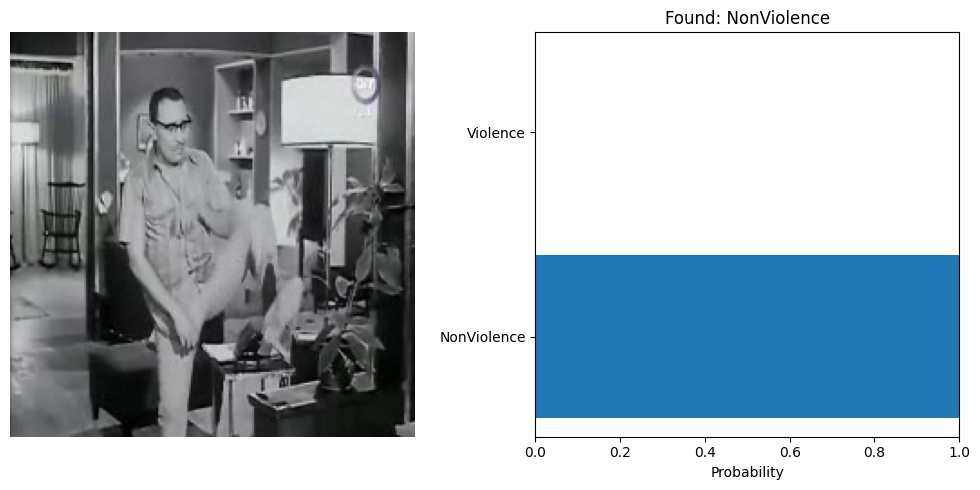

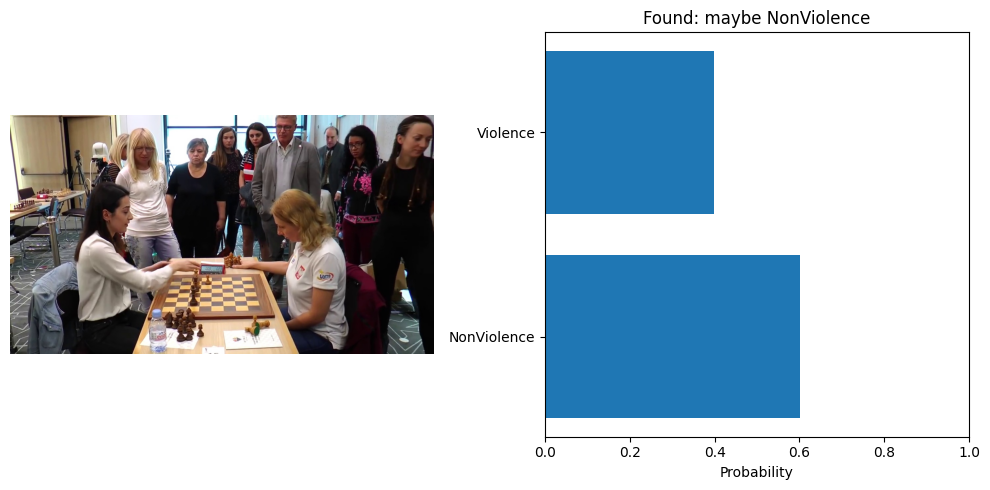

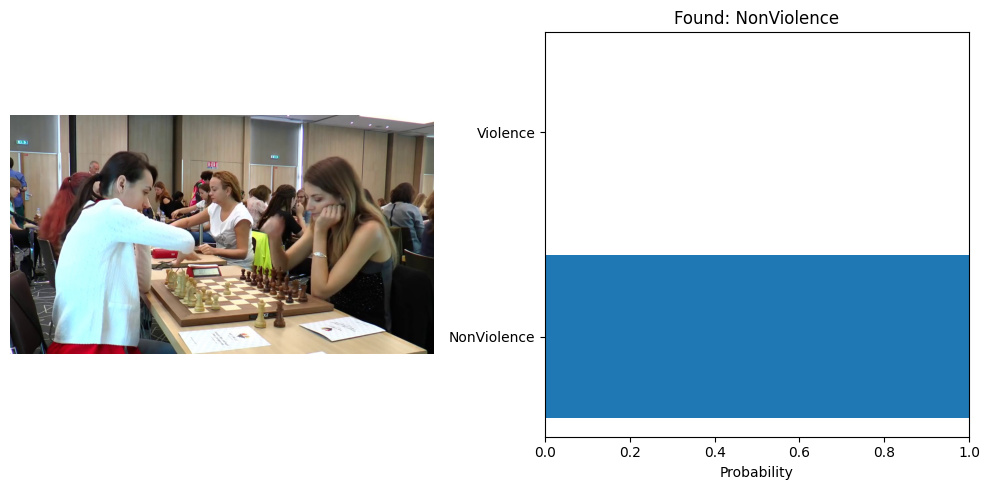

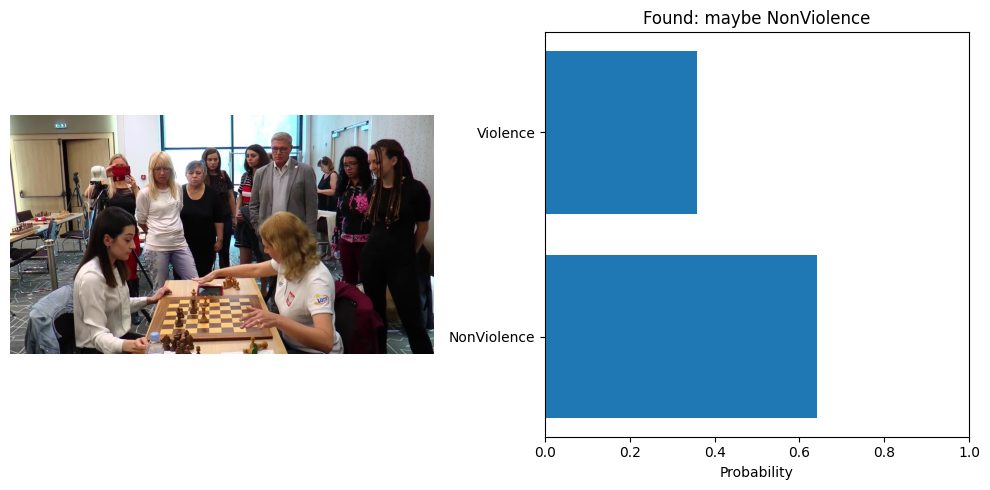

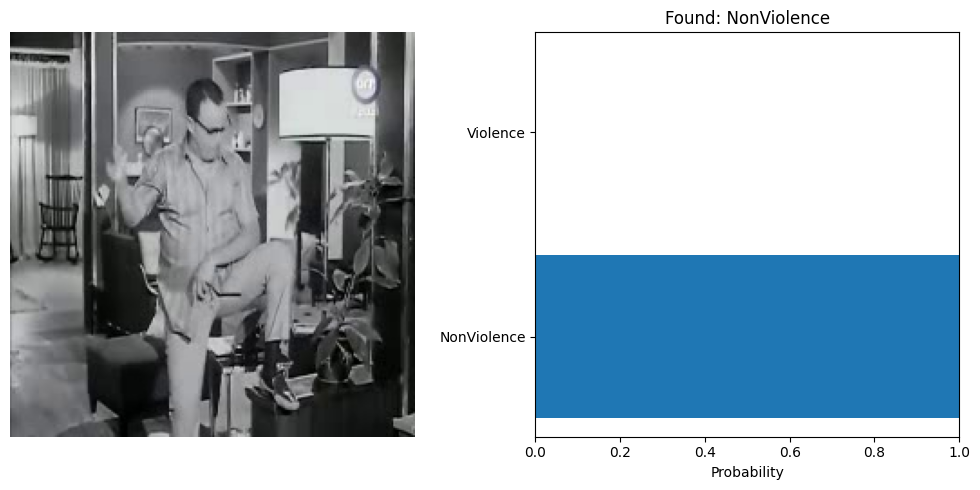

In [46]:
from glob import glob
test_images = glob('data/ValViolence/NonViolence/*/**')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)

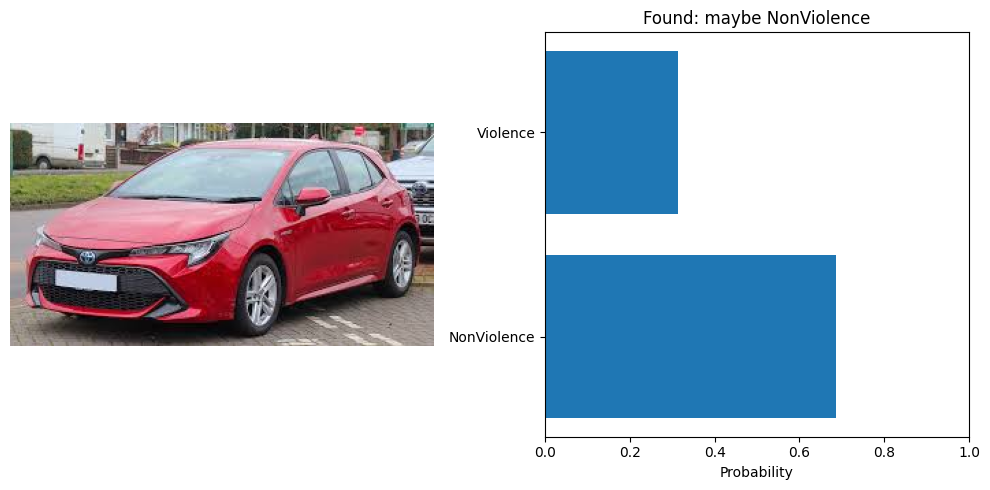

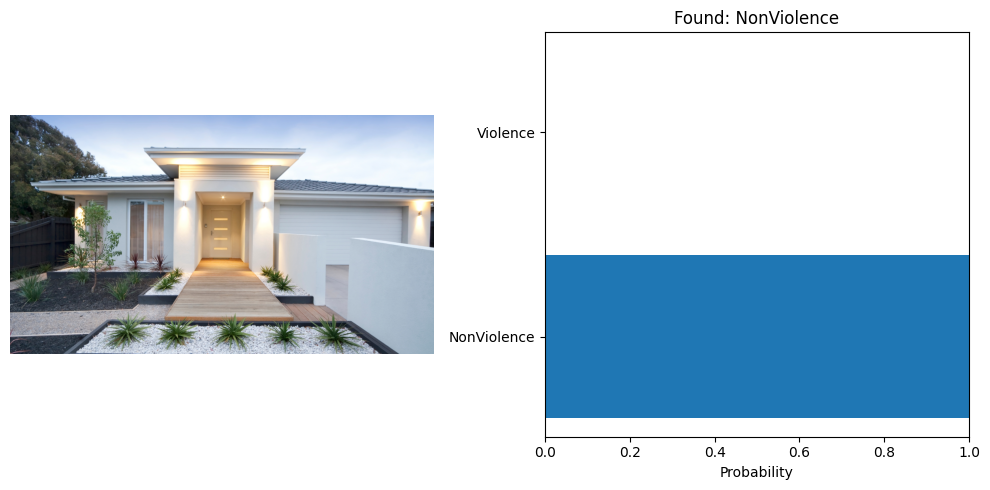

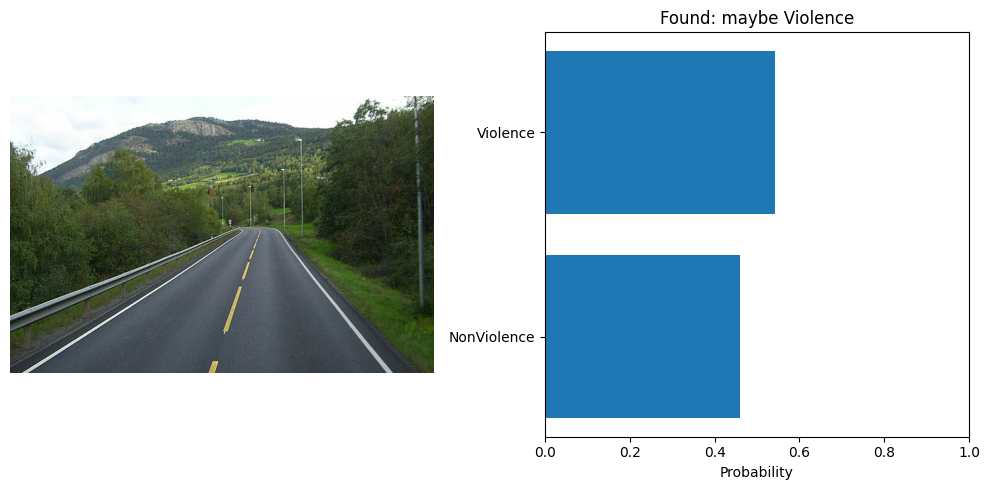

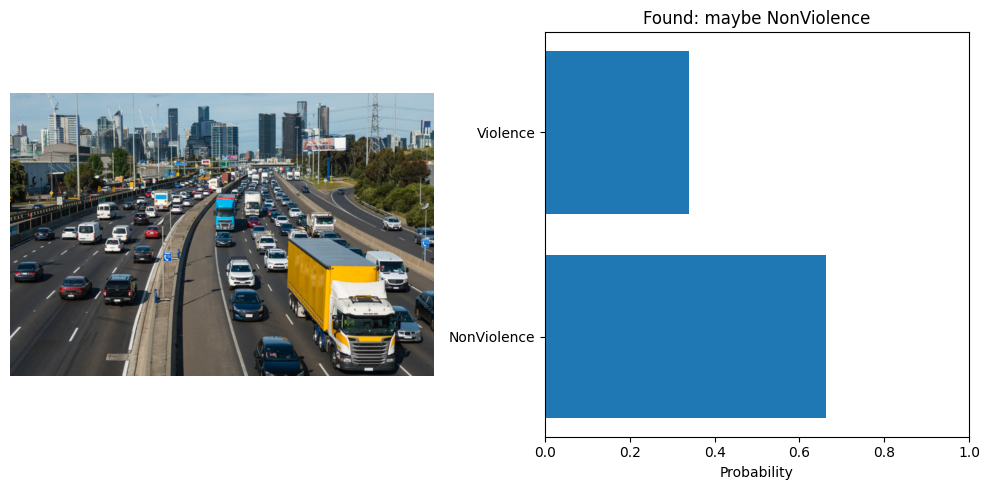

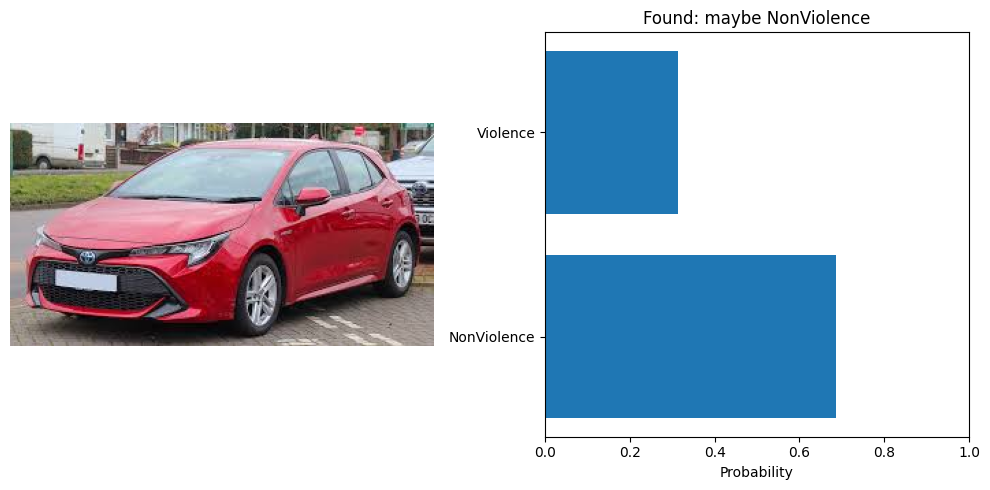

...

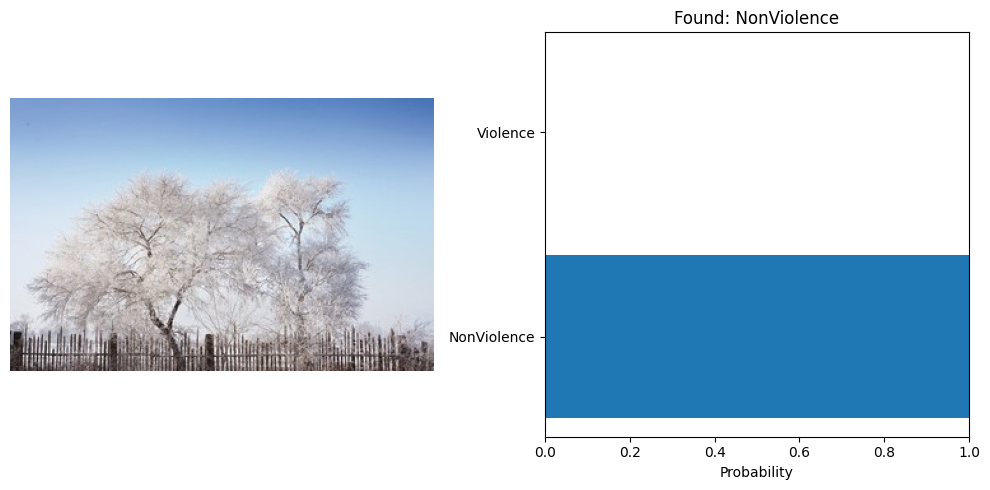

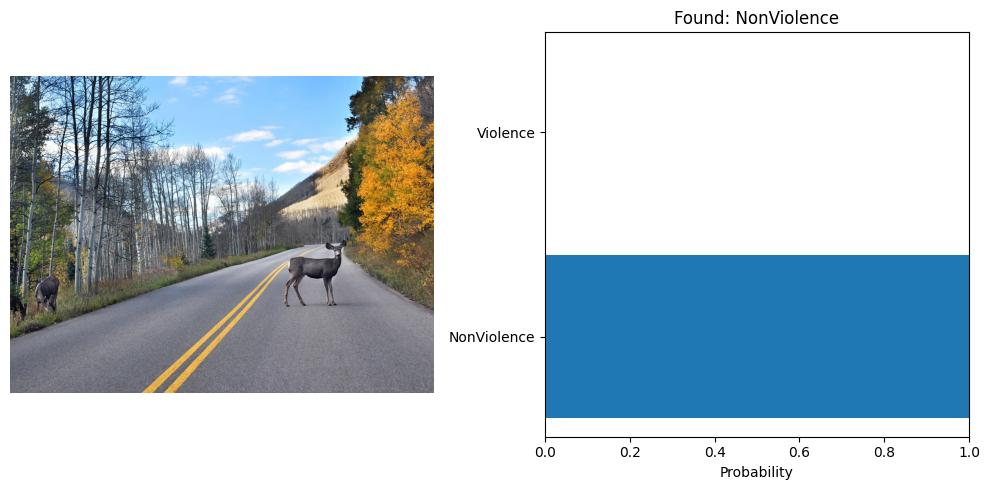

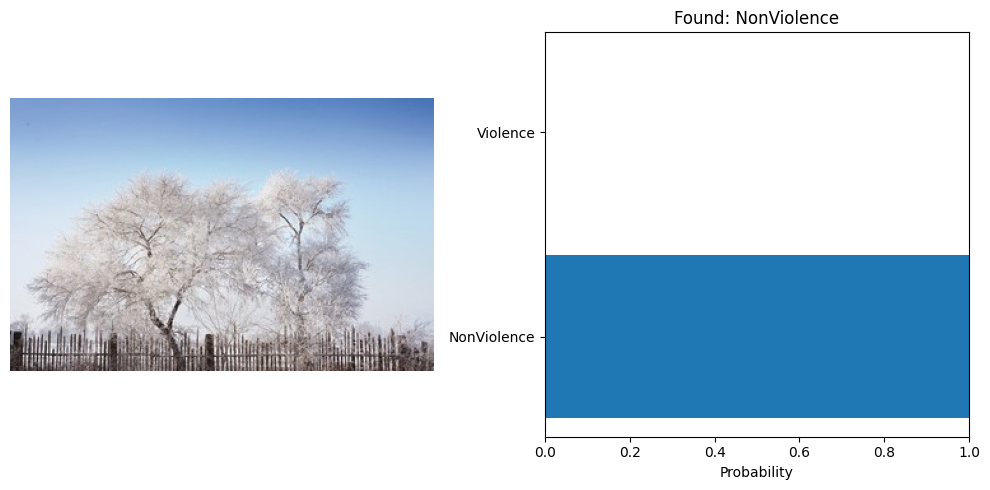

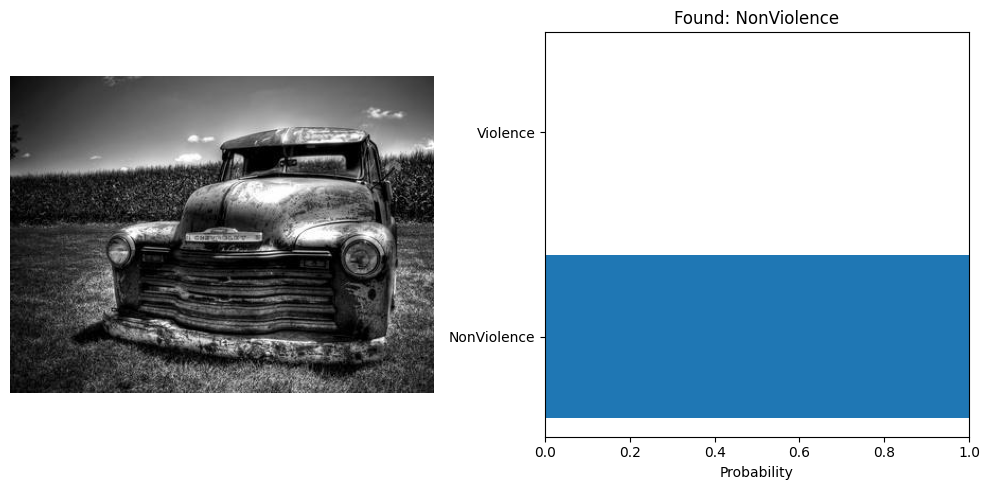

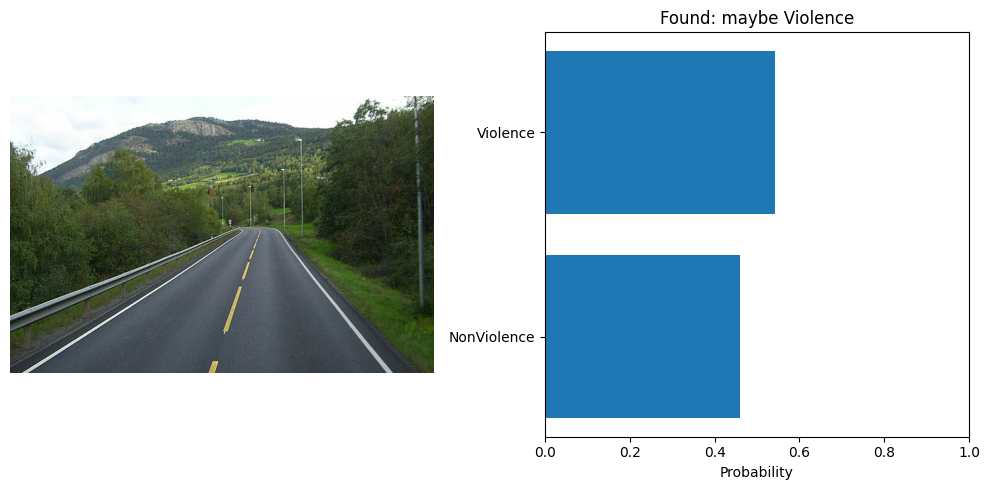

In [44]:
from glob import glob
test_images = glob('data/ValViolence/random/*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example)
    probabilities = predict(model_fit, image_tensor, device)
 
    visualize_predictions(original_image, probabilities, classNames)

In [102]:
def check_all_frames(folder_path, class_names):
    test_images = glob(folder_path)

    found_classes = []
    for example in test_images:
        original_image, image_tensor = preprocess_image(example)
        probabilities = predict(model_fit, image_tensor, device)

        for i, x in enumerate(class_names):
            if(probabilities[i] > 0.95):
                found_classes.append(x)
            else:
                found_classes.append('unsure')    

    for name in class_names:
        print(name + ": " + str(found_classes.count(name)))   

    print('unsure' + ": " + str(found_classes.count('unsure'))) 
    

In [105]:
print('non fight 1')
check_all_frames('data/ValViolence/NonViolence/NonFight1/*', classNames)
print('')

print('non fight 2')
check_all_frames('data/ValViolence/NonViolence/NonFight2/*', classNames)
print('')

print('non fight 3')
check_all_frames('data/ValViolence/NonViolence/NonFight3/*', classNames)
print('')

non fight 1
NonViolence: 14
Violence: 0
unsure: 14

non fight 2
NonViolence: 25
Violence: 0
unsure: 25

non fight 3
NonViolence: 20
Violence: 0
unsure: 102



In [106]:
print('fight 1')
check_all_frames('data/ValViolence/Violence/fight1/*', classNames)
print('')

print('fight 2')
check_all_frames('data/ValViolence/Violence/fight2/*', classNames)
print('')

print('fight 3')
check_all_frames('data/ValViolence/Violence/fight3/*', classNames)
print('')

fight 1
NonViolence: 10
Violence: 0
unsure: 32

fight 2
NonViolence: 0
Violence: 37
unsure: 49

fight 3
NonViolence: 2
Violence: 249
unsure: 453

